# Nota

Este notebook serve para exercutar o código organizado nos diferentes ficheiros, usamos o `dev` para fazer o desenvolvimento pois é mais rápido para testar mas depois organizamos o código em diferentes ficheiros e fazemos as chamadas aqui em `main`.

In [1]:
# Importing classes of the project

# Reload classes in memory every time this code block is executed
%load_ext autoreload
%autoreload 2

# Importing necessary libraries
import pandas as pd


# Data Analysis Classes
from data_analysis.database import KagglehubSQLiteLoader
from data_analysis.analizer import TripDataAnalizer
from data_analysis.preprocessor import DataPreprocessor
from data_analysis.cleaner import DataCleaning

# EDA classes
from eda.eda import EDA
from eda.visualization import DataVisualization
from eda.featureAnalysis import FeatureAnalysis
from eda.featureGenerator import FeatureGenerator

# Statistical Analysis classes
from statistical_analysis.hypothesisTesting import HypothesisTesting

C:\Users\usoda\anaconda3\envs\Project_dependencies\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
### Generate dataset to work with in following phases ###

# Load all 12 SQLite databases with data from all months
dataframes = []

for i in range(1,13):
    file = f"\\2019\\2019-{i:02}.sqlite"
    data = KagglehubSQLiteLoader("dhruvildave/new-york-city-taxi-trips-2019", file)

    # Random sample those databases to get a general sample with data from all of them


    #df = data.get_table_dataframe_random_sample('tripdata', percentage=0.0001)
    df = data.get_table_dataframe_nrows('tripdata', 1000)
    dataframes.append(df)



Dataset downloaded Successfully 
Dataset saved on:  C:\Users\usoda\.cache\kagglehub\datasets\dhruvildave\new-york-city-taxi-trips-2019\versions\4
Dataset downloaded Successfully 
Dataset saved on:  C:\Users\usoda\.cache\kagglehub\datasets\dhruvildave\new-york-city-taxi-trips-2019\versions\4
Dataset downloaded Successfully 
Dataset saved on:  C:\Users\usoda\.cache\kagglehub\datasets\dhruvildave\new-york-city-taxi-trips-2019\versions\4
Dataset downloaded Successfully 
Dataset saved on:  C:\Users\usoda\.cache\kagglehub\datasets\dhruvildave\new-york-city-taxi-trips-2019\versions\4
Dataset downloaded Successfully 
Dataset saved on:  C:\Users\usoda\.cache\kagglehub\datasets\dhruvildave\new-york-city-taxi-trips-2019\versions\4
Dataset downloaded Successfully 
Dataset saved on:  C:\Users\usoda\.cache\kagglehub\datasets\dhruvildave\new-york-city-taxi-trips-2019\versions\4
Dataset downloaded Successfully 
Dataset saved on:  C:\Users\usoda\.cache\kagglehub\datasets\dhruvildave\new-york-city-taxi-

In [3]:
# Join all the samples in a single dataframe
df = pd.concat(dataframes, ignore_index=True)


# Apply Analysis
analizer = TripDataAnalizer(df, "fare_amount")

# Apply Preprocessing
preprocessor = DataPreprocessor(analizer, 5)

# Apply Clean up
cleaner = DataCleaning(analizer)
cleaner.remove_outliers()
cleaner.handle_missing_values()

analizer.data_train

Feature columns extracted successfully.
Data divided successfully.
Features normalized successfully.
Missing values handled using strategy: drop


C:\Users\usoda\AppData\Local\Temp\ipykernel_20412\4080663092.py:2: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat(dataframes, ignore_index=True)


,trip_distance,tip_amount,tolls_amount,extra,pickup_time_in_seconds,dropoff_time_in_seconds,passenger_count,pickup_hour,pickup_day_of_week,pickup_day_of_month,...,dropoff_day_of_week,dropoff_day_of_month,dropoff_month,mta_tax,congestion_surcharge,vendorid,ratecodeid,pulocationid,dolocationid,payment_type
4397,-0.561783,0.244541,-0.223944,1.541689,-0.446358,-0.446413,-0.495376,-0.153489,-0.477966,-0.153012,...,-0.476772,-0.074061,-0.438730,0.076381,0.505313,0.000000,0.0,0.605364,0.178030,0.000000
10563,-0.630381,-0.081960,-0.223944,1.541689,1.306705,1.306643,1.353975,-0.153489,0.482367,-0.153012,...,0.483876,-0.074061,1.300369,0.076381,0.505313,0.000000,0.0,0.881226,0.295455,0.000000
11091,-0.678400,-0.734961,-0.223944,-0.629589,1.592542,1.592462,-0.495376,-0.153489,1.442700,-0.153012,...,1.444524,-0.074061,1.590218,0.076381,0.505313,0.333333,0.0,0.869732,0.329545,0.333333
9525,-0.618948,-0.734961,-0.223944,-0.629589,1.011407,1.011342,3.203326,-0.153489,-0.958132,-0.153012,...,-0.957096,-0.074061,1.010519,0.076381,0.505313,0.333333,0.0,0.865900,0.375000,0.333333
6518,-0.390287,-0.506411,-0.223944,-0.629589,0.134822,0.134792,-0.495376,-0.153489,-1.438298,-0.153012,...,-1.437420,-0.074061,0.140970,0.076381,0.505313,0.333333,0.0,0.636015,0.424242,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3064,-0.525197,-0.734961,-0.223944,-0.629589,-0.732403,-0.732449,4.128002,6.644981,1.442700,6.716435,...,-1.437420,-0.074061,-0.728580,0.076381,0.505313,0.333333,0.0,0.613027,0.867424,0.333333
9901,-0.678400,-0.408460,-0.223944,-0.629589,1.011400,1.011329,-0.495376,-0.153489,-0.958132,-0.153012,...,-0.957096,-0.074061,1.010519,0.076381,0.505313,0.333333,0.0,0.521073,0.988636,0.000000
1730,-0.760718,-0.734961,-0.223944,-0.629589,-1.294338,-1.294421,-0.495376,-0.153489,0.482367,-0.153012,...,0.483876,-0.074061,-1.308279,0.076381,-1.957143,0.333333,0.0,0.862069,0.863636,0.333333
3207,0.339141,0.244541,-0.223944,-0.629589,-0.732120,-0.732105,-0.495376,-0.153489,-1.438298,-0.153012,...,-1.437420,-0.074061,-0.728580,0.076381,0.505313,0.333333,0.0,0.176245,0.022727,0.000000


Dataset Info:

<class 'pandas.core.frame.DataFrame'>
Index: 8796 entries, 4397 to 10199
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   trip_distance            8796 non-null   float64
 1   tip_amount               8796 non-null   float64
 2   tolls_amount             8796 non-null   float64
 3   extra                    8796 non-null   float64
 4   pickup_time_in_seconds   8796 non-null   float64
 5   dropoff_time_in_seconds  8796 non-null   float64
 6   passenger_count          8796 non-null   float64
 7   pickup_hour              8796 non-null   float64
 8   pickup_day_of_week       8796 non-null   float64
 9   pickup_day_of_month      8796 non-null   float64
 10  pickup_month             8796 non-null   float64
 11  dropoff_hour             8796 non-null   float64
 12  dropoff_day_of_week      8796 non-null   float64
 13  dropoff_day_of_month     8796 non-null   float64
 14  dropoff_mo

<Figure size 1200x600 with 0 Axes>

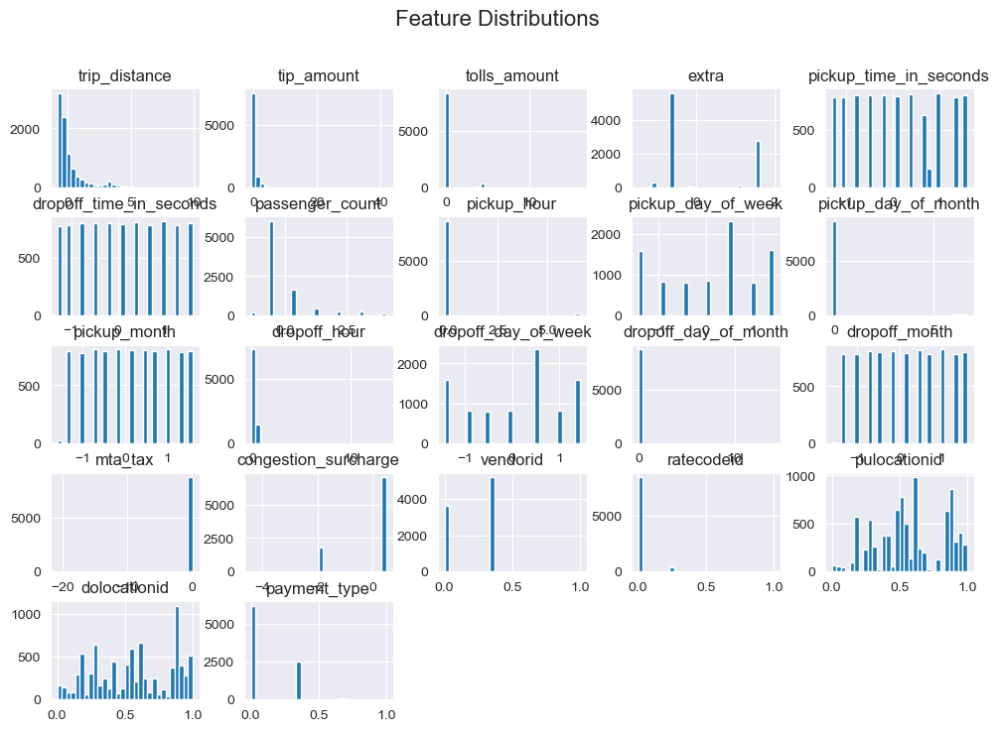

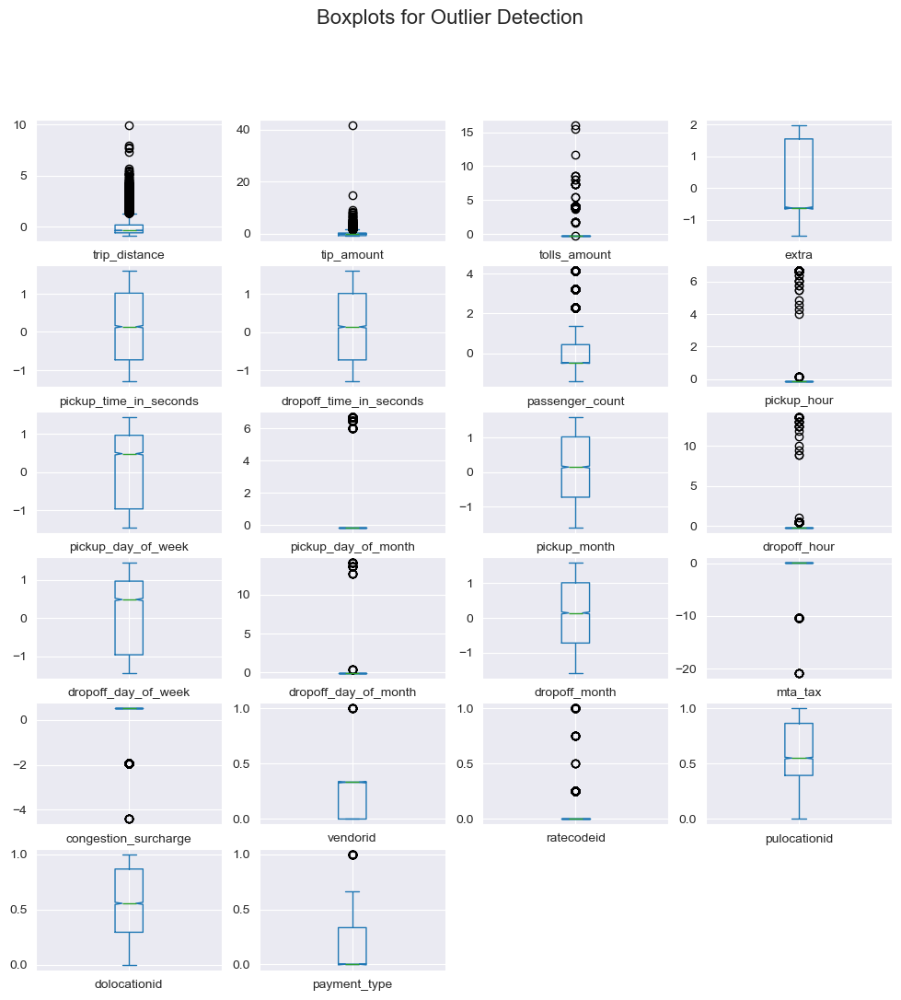

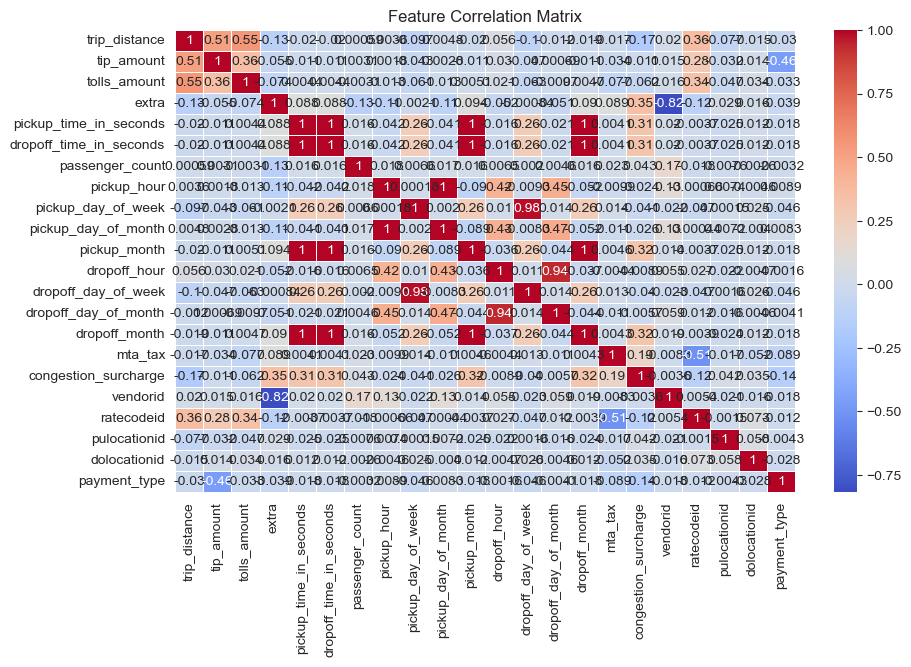

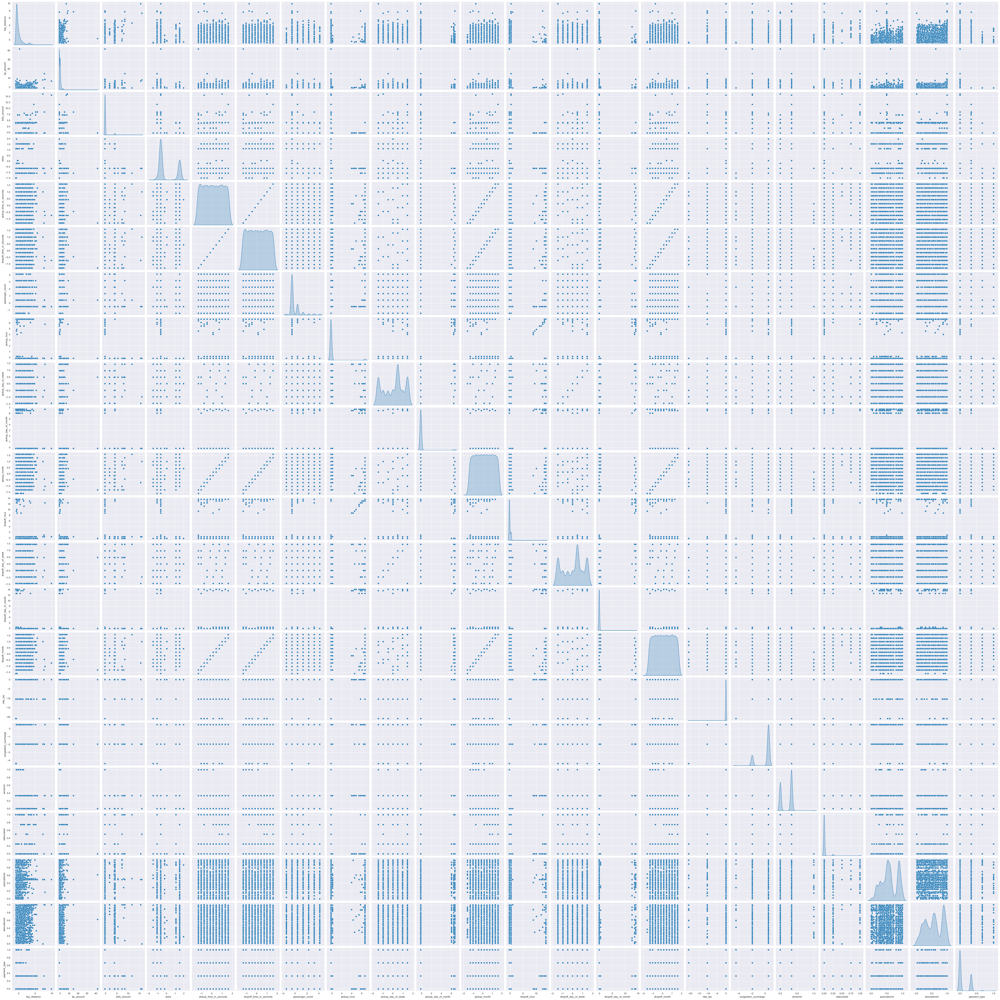

EDA completed successfully.


In [4]:
eda = EDA(analizer)
eda.run_eda()


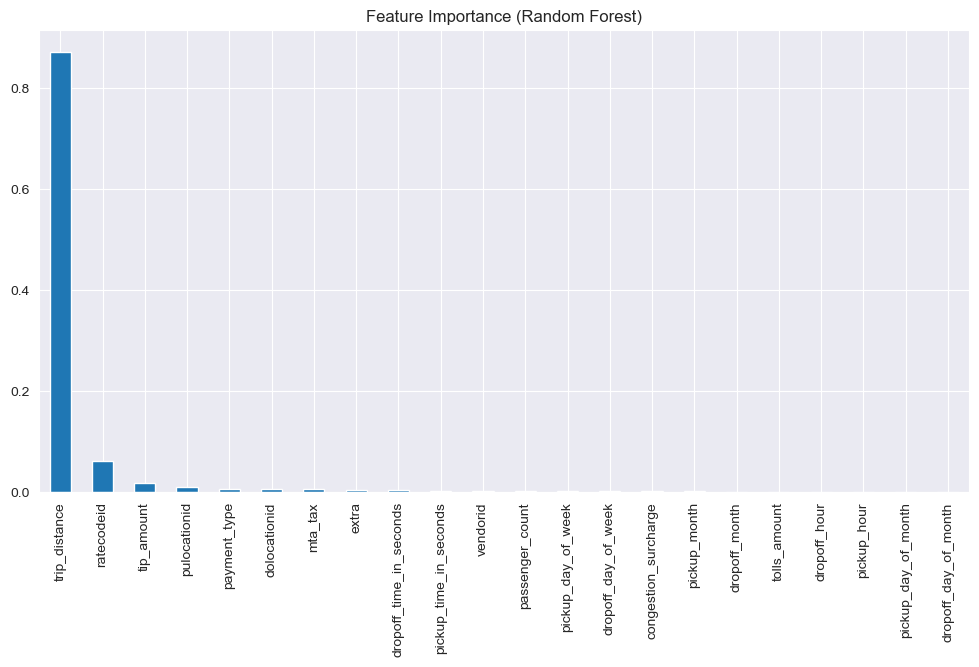

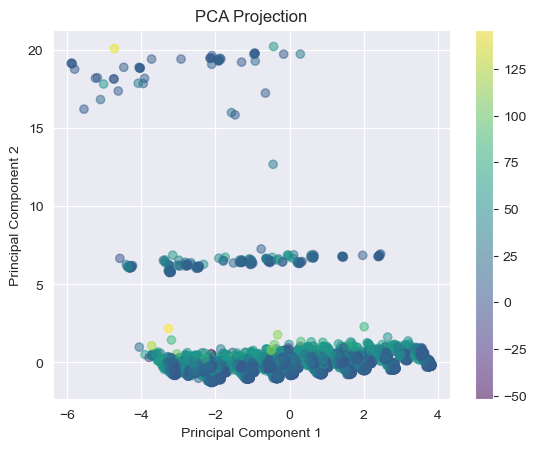

Feature Analysis completed successfully.


In [5]:
analysis = FeatureAnalysis(analizer)
analysis.run_all()

Trip duration calculated successfully.
Trip duration calculated successfully.


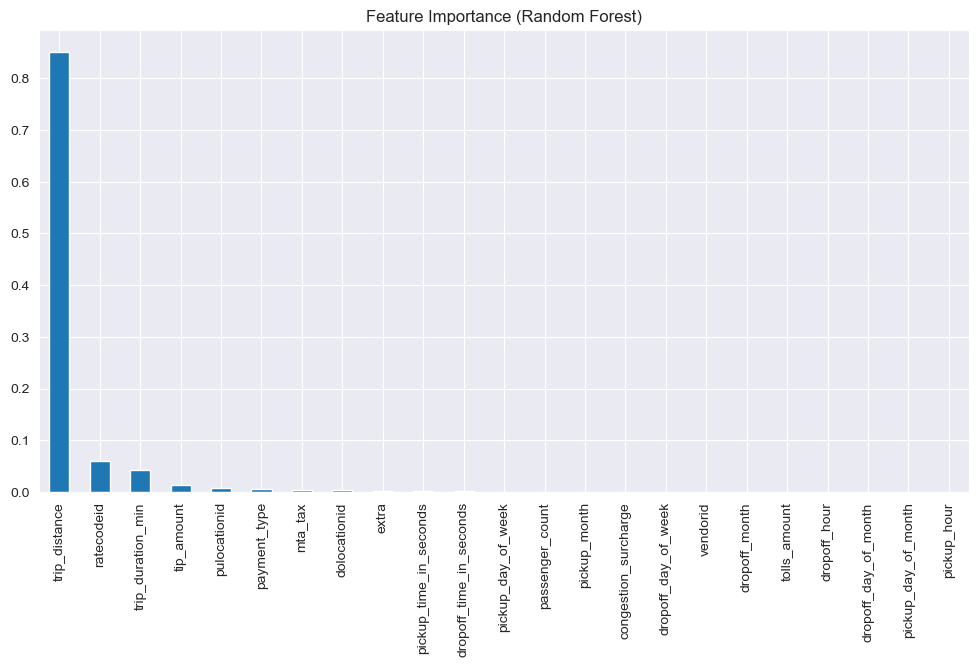

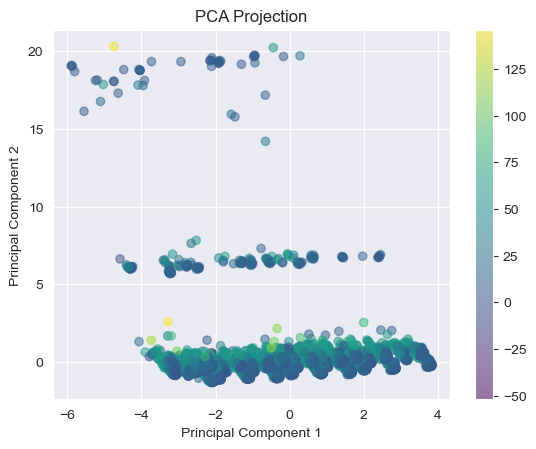

Feature Analysis completed successfully.


In [6]:
# Create new features and reapply FeatureAnalysis

feature_generator = FeatureGenerator(analizer)
feature_generator.generate_features()

analysis = FeatureAnalysis(analizer)
analysis.run_all()


Data Visualization Plots:
-------------------------

Pairplot:


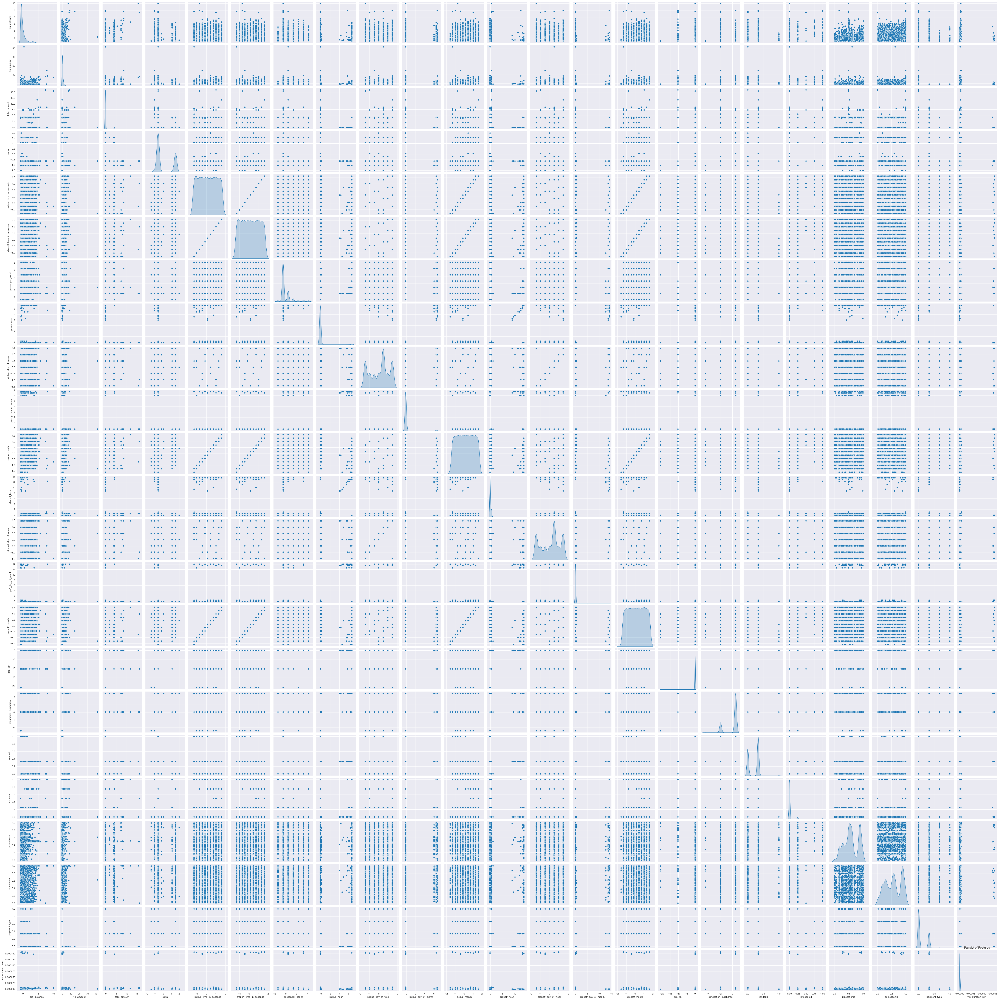


Boxplot:


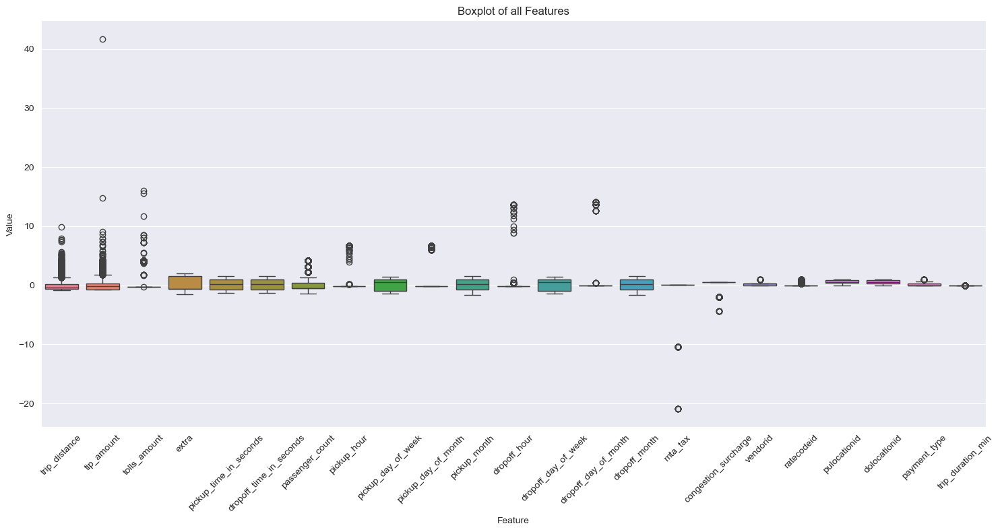


Ridgeplot:


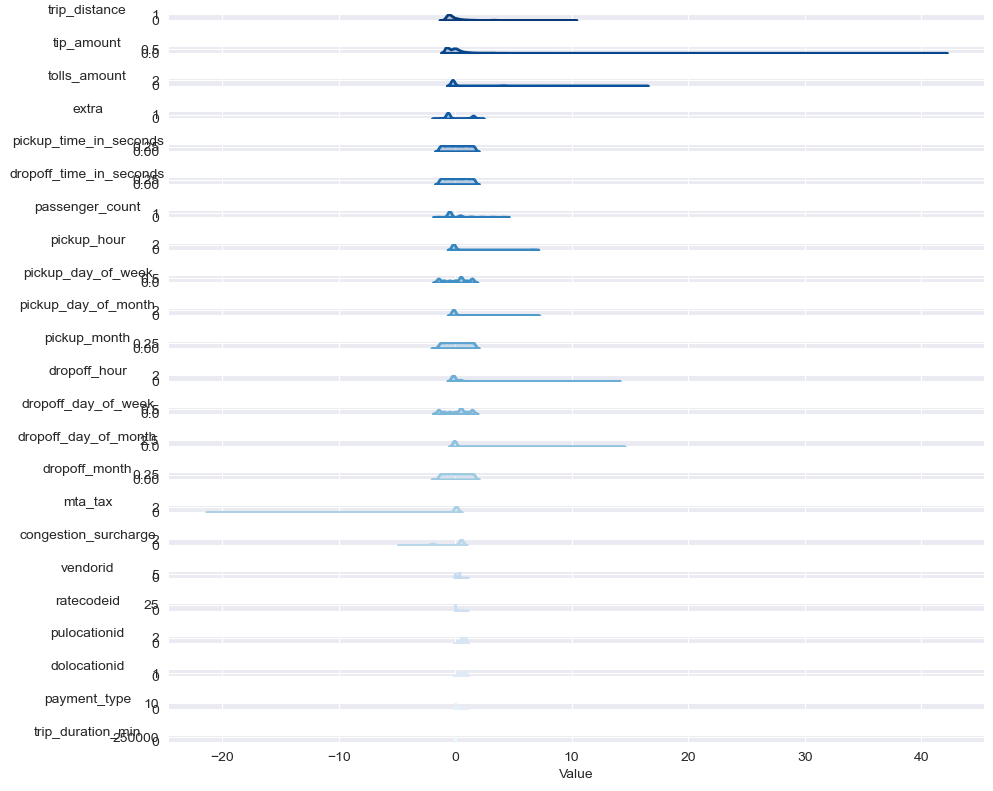

In [7]:
visualizer = DataVisualization(analizer)
visualizer.perform_visualization()

In [ ]:
hypothesisTester = HypothesisTesting(analizer)

hypothesisTester.t_test_results()
hypothesisTester.anova_results()
hypothesisTester.kruskal_wallis_results()




T-test results:
Feature: trip_distance
Class 1: 6.5,  Class 2: 6.0
Significant
Class 1: 6.5,  Class 2: 4.5
Significant
Class 1: 6.5,  Class 2: 5.5
Significant
Class 1: 6.5,  Class 2: 9.5
Significant
Class 1: 6.5,  Class 2: 10.0
Significant
Class 1: 6.5,  Class 2: 14.0
Significant
Class 1: 6.5,  Class 2: 2.5
Significant
Class 1: 6.5,  Class 2: 8.5
Significant
Class 1: 6.5,  Class 2: 18.0
Significant
Class 1: 6.5,  Class 2: 7.5
Significant
Class 1: 6.5,  Class 2: 18.5
Significant
Class 1: 6.5,  Class 2: 21.5
Significant
Class 1: 6.5,  Class 2: 9.0
Significant
Class 1: 6.5,  Class 2: 5.0
Significant
Class 1: 6.5,  Class 2: 8.0
Significant
Class 1: 6.5,  Class 2: 15.0
Significant
Class 1: 6.5,  Class 2: 12.0
Significant
Class 1: 6.5,  Class 2: 31.0
Significant
Class 1: 6.5,  Class 2: 4.0
Significant
Class 1: 6.5,  Class 2: 24.5
Significant
Class 1: 6.5,  Class 2: 17.0
Significant
Class 1: 6.5,  Class 2: 20.5
Significant
Class 1: 6.5,  Class 2: 11.0
Significant
Class 1: 6.5,  Class 2: 12.

C:\Users\usoda\anaconda3\envs\Project_dependencies\Lib\site-packages\scipy\stats\_axis_nan_policy.py:586: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


Significant
Class 1: 6.0,  Class 2: 21.5
Significant
Class 1: 6.0,  Class 2: 9.0
Significant
Class 1: 6.0,  Class 2: 5.0
Significant
Class 1: 6.0,  Class 2: 8.0
Significant
Class 1: 6.0,  Class 2: 15.0
Significant
Class 1: 6.0,  Class 2: 12.0
Significant
Class 1: 6.0,  Class 2: 31.0
Significant
Class 1: 6.0,  Class 2: 4.0
Significant
Class 1: 6.0,  Class 2: 24.5
Significant
Class 1: 6.0,  Class 2: 17.0
Significant
Class 1: 6.0,  Class 2: 20.5
Significant
Class 1: 6.0,  Class 2: 11.0
Significant
Class 1: 6.0,  Class 2: 12.5
Significant
Class 1: 6.0,  Class 2: 20.0
Significant
Class 1: 6.0,  Class 2: 16.5
Significant
Class 1: 6.0,  Class 2: 13.0
Significant
Class 1: 6.0,  Class 2: 11.5
Significant
Class 1: 6.0,  Class 2: 7.0
Significant
Class 1: 6.0,  Class 2: 16.0
Significant
Class 1: 6.0,  Class 2: 19.0
Significant
Class 1: 6.0,  Class 2: 10.5
Significant
Class 1: 6.0,  Class 2: 24.0
Significant
Class 1: 6.0,  Class 2: 33.5
Significant
Class 1: 6.0,  Class 2: 23.0
Significant
Class 1: 

C:\Users\usoda\anaconda3\envs\Project_dependencies\Lib\site-packages\scipy\stats\_stats_py.py:6194: RuntimeWarning: invalid value encountered in scalar divide
  svar = ((n1 - 1) * v1 + (n2 - 1) * v2) / df


Significant
Class 1: 39.0,  Class 2: 42.0
Not Significant
Class 1: 39.0,  Class 2: 37.5
Not Significant
Class 1: 39.0,  Class 2: 51.5
Significant
Class 1: 39.0,  Class 2: 85.5
Significant
Class 1: 39.0,  Class 2: 0.01
Significant
Class 1: 39.0,  Class 2: 48.0
Significant
Class 1: 39.0,  Class 2: 37.0
Not Significant
Class 1: 39.0,  Class 2: 47.0
Significant
Class 1: 39.0,  Class 2: 48.5
Significant
Class 1: 39.0,  Class 2: 30.0
Significant
Class 1: 39.0,  Class 2: 53.5
Significant
Class 1: 39.0,  Class 2: 43.0
Significant
Class 1: 39.0,  Class 2: 104.0
Significant
Class 1: 39.0,  Class 2: 55.0
Not Significant
Class 1: 39.0,  Class 2: -3.5
Significant
Class 1: 39.0,  Class 2: 54.5
Significant
Class 1: 39.0,  Class 2: -5.0
Significant
Class 1: 39.0,  Class 2: 49.0
Significant
Class 1: 39.0,  Class 2: 9.8
Significant
Class 1: 39.0,  Class 2: 0.0
Significant
Class 1: 39.0,  Class 2: 61.5
Significant
Class 1: 39.0,  Class 2: 36.5
Significant
Class 1: 39.0,  Class 2: 54.0
Not Significant
Cla